# Music Emotion VAE

Run the VAE to project music features extracted by ExtractMusicFeatures file into the 2D latent emotion space (Valence, Arousal). 

### Author

Takeshi Matsumura

In [ ]:
import pandas as pd

import matplotlib.pylab as plt
import tensorflow as tf
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

from model.MusicEmotionVAE import MusicEmotionVAE
from common.common_music import music_key_encoding, music_key_decoding
from common import common

In [ ]:
common.init_notebook()

In [ ]:
input_dir = common.data_path("music_emotion_vae_out")

In [ ]:
my_2_palette = [sns.color_palette("rainbow", 5)[0], sns.color_palette("rainbow", 5)[4]]
my_5_palette = sns.color_palette("rainbow", 5)

In [ ]:
# Takeshi: Initialize the random seed. This line makes the result reproducible.
# Restarting Kernel is not needed.
tf.keras.utils.set_random_seed(123)

In [ ]:
# Declare music key encoding method (one of 'onehot', 'circular' and 'linear')
key_encoding = 'onehot'
# key_encoding = 'circular'
# key_encoding = 'accidentals'
# key_encoding = 'linear'

In [ ]:
# The csv file is created by 6-ExtractMusicFeatures.ipynb.
df = pd.read_csv(f"{input_dir}/music_feature_vae_input.csv")
music_emotion_vae = MusicEmotionVAE(key_encoding)
label_set = df[music_emotion_vae.va_cols]
# The dimension of the latent emotional space. Start with 2 (Valence & Arousal).
latent_dim = 2

# The units of the VAE Dense Layers. Explored by Optuna (Trial 48 in music-emotion-vae-12: onehot encoding)
units = [452, 308, 484, 444, 256]

# The weights of loss functions. Explored by Optuna (Trial 252 in music-emotion-vae-13: onehot encoding)
va_weight = 8.8
mode_weight = 0.9
key_weight = 0.0
beta = 0.1

In [ ]:
# Count the number of major and minor mode samples
major_mode_samples = df[df['mode'] == 'major'].shape[0]
minor_mode_samples = df[df['mode'] == 'minor'].shape[0]
total_samples = df.shape[0]
print("Major mode samples = %d (%.2f%%)" % (major_mode_samples, major_mode_samples / total_samples))
print("Minor mode samples = %d (%.2f%%)" % (minor_mode_samples, minor_mode_samples / total_samples))


Major mode samples = 1630 (0.54%)
Minor mode samples = 1370 (0.46%)


In [ ]:
df = music_emotion_vae.standardise_data(df)
df.describe()

,Valence,Arousal,mean_note_duration,c5_index,tempo,pitch_range
count,2935.000000,2935.000000,2935.000000,2935.000000,2935.000000,2935.000000
mean,0.531441,0.492650,0.668140,5.764906,116.997325,41.406814
std,0.212229,0.234867,0.332069,2.712778,41.475691,13.452817
min,0.000000,0.000000,0.000000,0.000000,10.000000,3.000000
25%,0.368421,0.285714,0.450378,4.000000,84.000000,34.000000
50%,0.552632,0.500000,0.602459,6.000000,120.000000,41.000000
75%,0.710526,0.690476,0.814586,7.000000,140.000000,51.000000
max,1.000000,1.000000,3.531250,11.000000,329.500000,84.000000


In [ ]:
# Music variables
vars = df.columns

In [ ]:
# Music features, some extracted by the Musif library.
# - Score_AverageDuration: Average duration of the note values in a given part/sound/family/score 
#   (quarter note = 1, eighth note = 0.5, etc.)
#   1/8 = 0.5, 1/4 = 1, 1/2 = 2, 1/1 = 4
# - Score_NotesMean: Mean of no. of notes for all parts in a sound/family.
# - tempo (From music21)
# - pitch_range (From music21): s.analyze('range').semitones (TBC)

df.describe()

,Valence,Arousal,mean_note_duration,c5_index,tempo,pitch_range
count,2935.000000,2935.000000,2935.000000,2935.000000,2935.000000,2935.000000
mean,0.531441,0.492650,0.668140,5.764906,116.997325,41.406814
std,0.212229,0.234867,0.332069,2.712778,41.475691,13.452817
min,0.000000,0.000000,0.000000,0.000000,10.000000,3.000000
25%,0.368421,0.285714,0.450378,4.000000,84.000000,34.000000
50%,0.552632,0.500000,0.602459,6.000000,120.000000,41.000000
75%,0.710526,0.690476,0.814586,7.000000,140.000000,51.000000
max,1.000000,1.000000,3.531250,11.000000,329.500000,84.000000


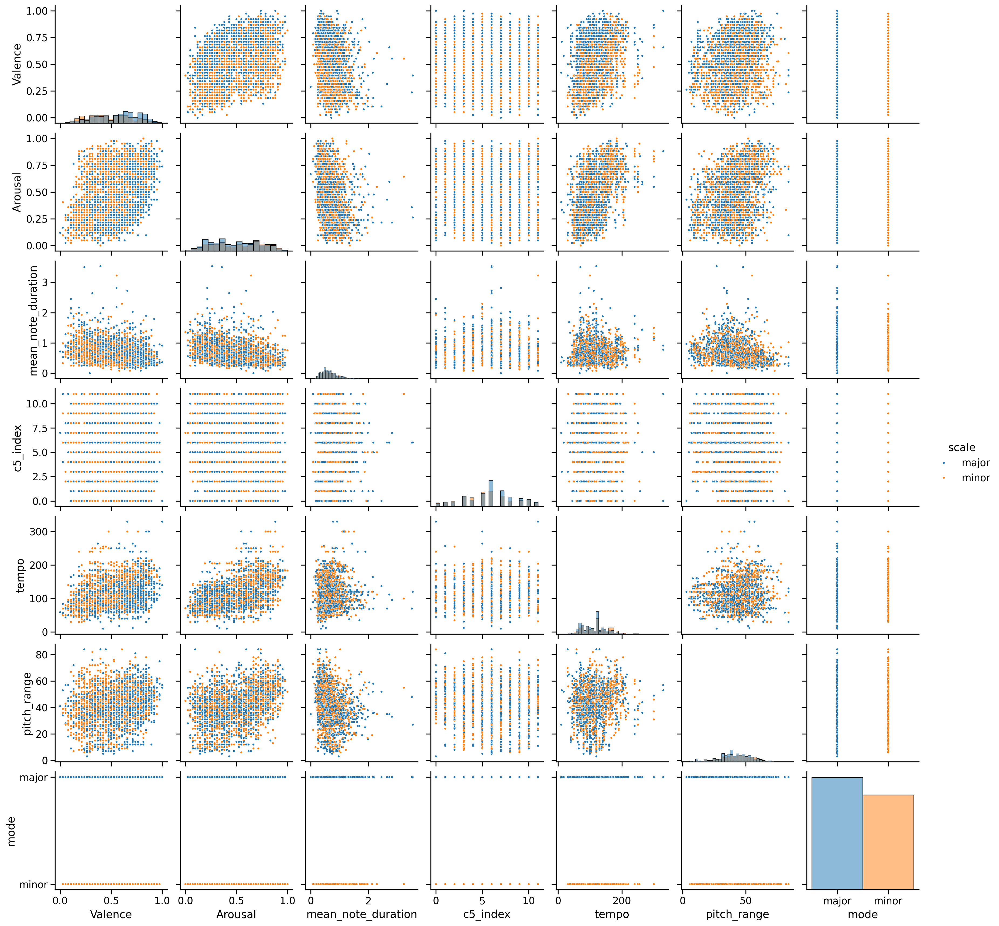

In [ ]:
ax = sns.pairplot(df, vars=vars, diag_kind='hist', hue='mode', plot_kws={'s': 8})
ax._legend.set_title("scale")

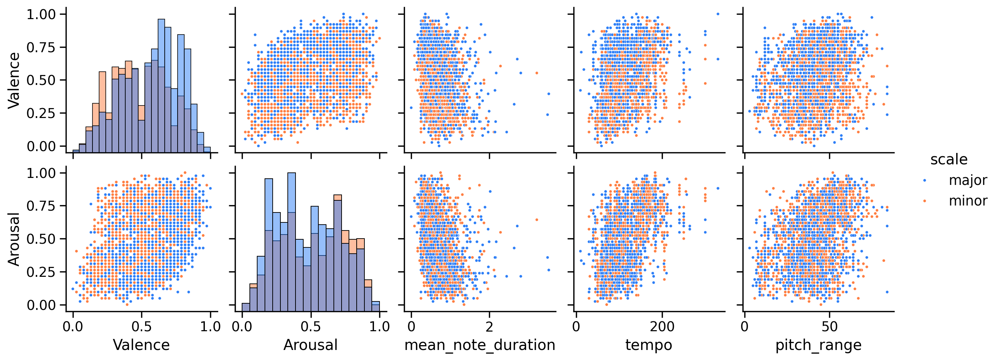

In [ ]:
x_vars = [v for v in vars if v not in ['mode', 'c5_index']]
ax = sns.pairplot(df, x_vars=x_vars, y_vars=music_emotion_vae.va_cols, diag_kind='hist', hue='mode', plot_kws={'s': 8}, hue_order=['major', 'minor'], palette=my_2_palette)
ax._legend.set_title("scale")

<Axes: >

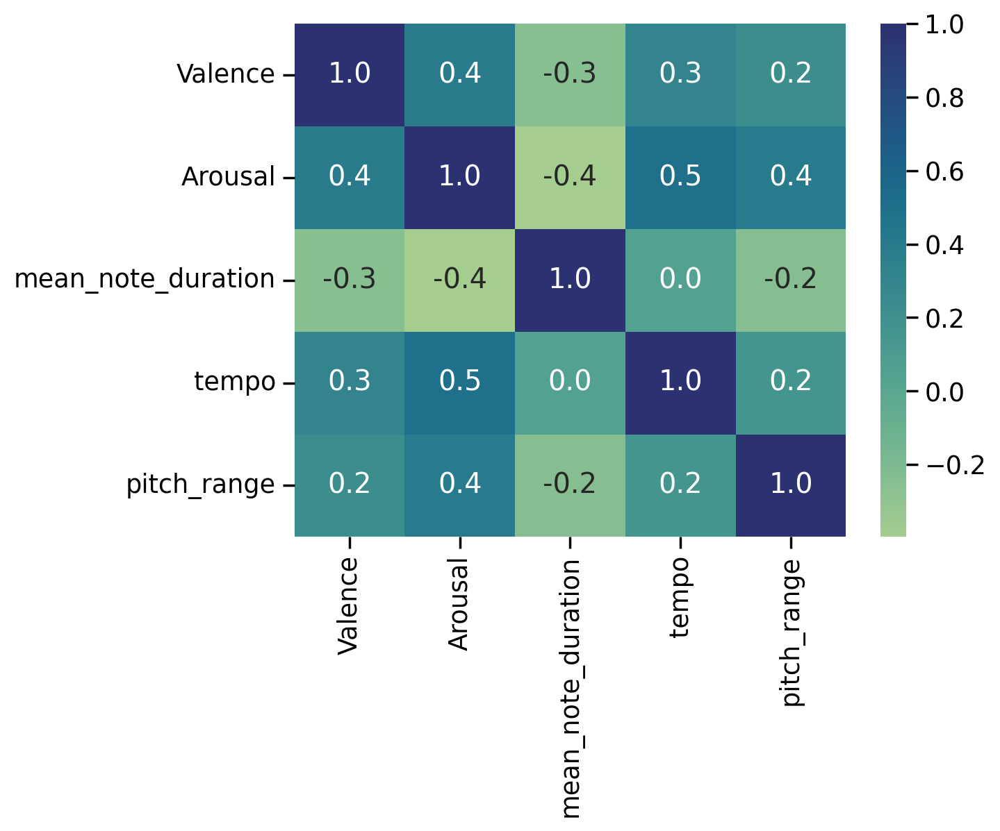

In [ ]:
sns.heatmap(df[x_vars].corr(), annot=True, cmap="crest", fmt=".1f")

<Axes: >

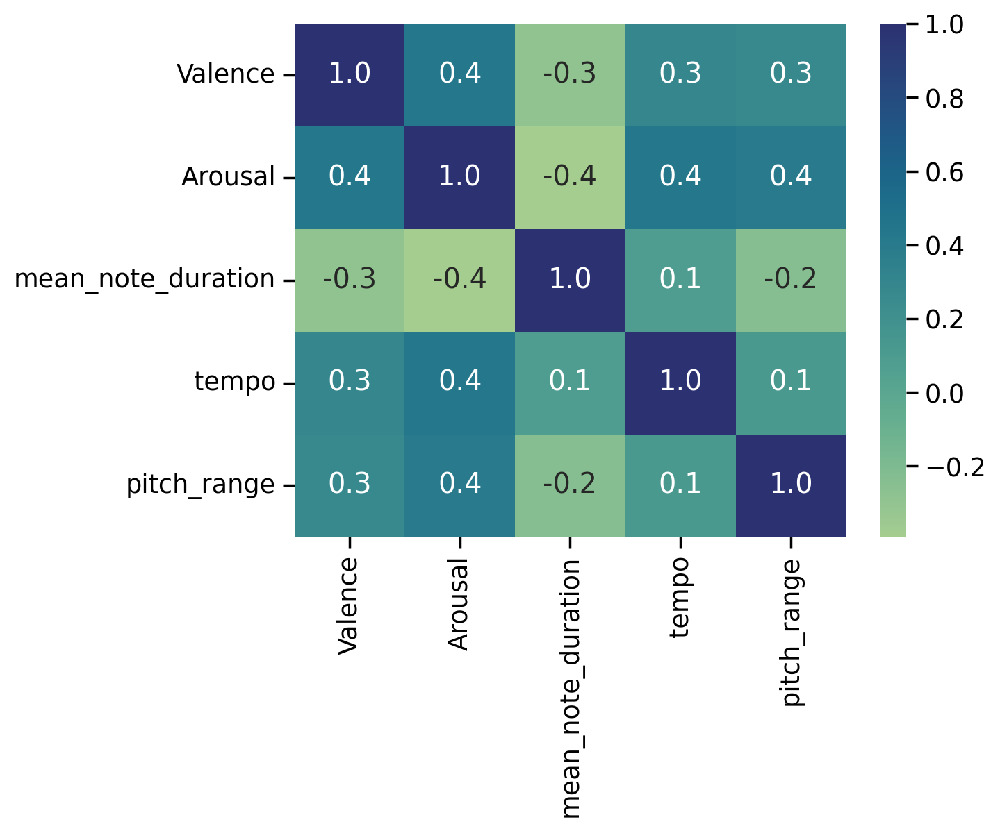

In [ ]:
sns.heatmap(df[df['mode'] == 'major'][x_vars].corr(), annot=True, cmap="crest", fmt=".1f")

<Axes: >

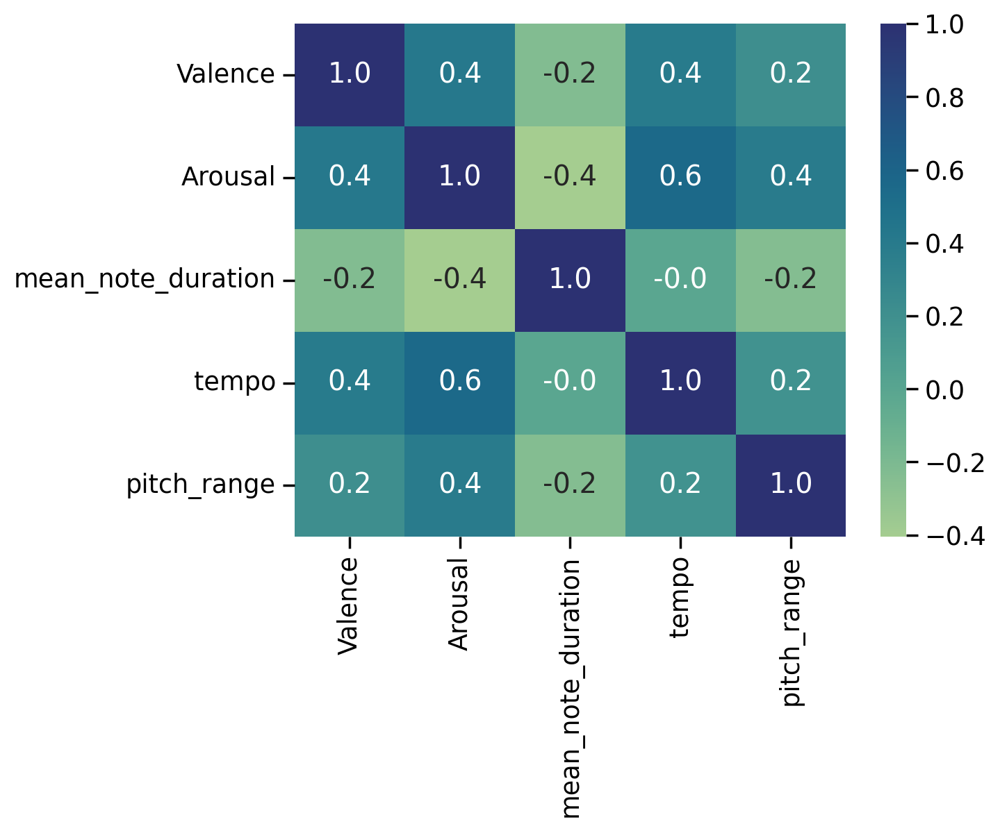

In [ ]:
sns.heatmap(df[df['mode'] == 'minor'][x_vars].corr(), annot=True, cmap="crest", fmt=".1f")

## Functions for scaling and normlisation.

In [ ]:
df_scaled = music_emotion_vae.scale_music_features(df)

<Axes: >

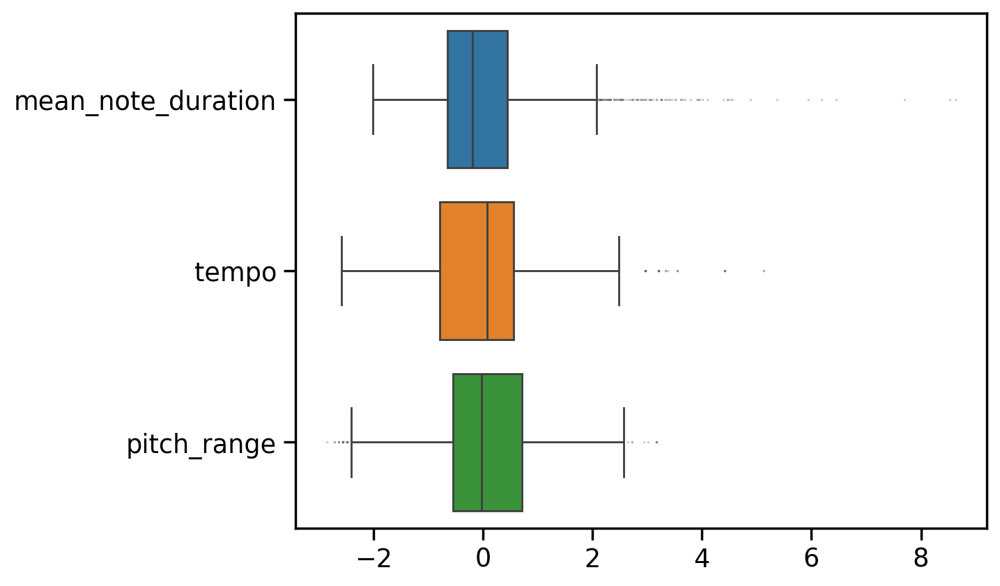

In [ ]:
sns.boxplot(df_scaled[music_emotion_vae.scale_vars], orient="h", fliersize=0.1)

In [ ]:
# Prepare the data for the VAE training.

label_set = df[music_emotion_vae.va_cols]
# label_set = np.asarray(label_set)
df_std = music_emotion_vae.prepare_data(df_scaled)

# Remember the number of music features before the one-hot encoding (exclude mode and c5_index)
music_features_columns = [col for col in df_std.columns.to_list() if col not in ['mode', 'c5_index', 'num_accidentals']]
num_music_features = len(music_features_columns)
df_std = music_key_encoding(df_std, key_encoding)

x_train,x_test,y_train,y_test = train_test_split(df_std,label_set,test_size=0.2,random_state=123)

df_std

,mean_note_duration,tempo,pitch_range,mode,c5_index_0,c5_index_1,c5_index_2,c5_index_3,c5_index_4,c5_index_5,c5_index_6,c5_index_7,c5_index_8,c5_index_9,c5_index_10,c5_index_11
0,-1.182181,0.072408,-0.848057,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.263291,0.072408,0.861913,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.677559,0.651159,-0.104592,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-0.051133,0.072408,-0.253285,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.343279,1.036993,0.118448,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,-0.004437,-0.024050,-1.145443,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2996,1.923659,0.072408,-0.401978,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2997,0.497553,0.554701,-1.814562,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2998,-0.486611,1.591629,-0.996750,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
music_emotion_vae.create_model(key_encoding, latent_dim, units, num_music_features, va_weight=va_weight, mode_weight=mode_weight, key_weight=key_weight, beta=beta)
music_emotion_vae.model.compile(tf.keras.optimizers.Adam(learning_rate=1e-4))

In [ ]:
x_train

,mean_note_duration,tempo,pitch_range,mode,c5_index_0,c5_index_1,c5_index_2,c5_index_3,c5_index_4,c5_index_5,c5_index_6,c5_index_7,c5_index_8,c5_index_9,c5_index_10,c5_index_11
1513,-0.558356,-0.096394,1.531032,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1292,0.729240,0.795847,-0.178938,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
994,-1.420764,-0.048165,0.490181,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1392,0.664883,1.133451,0.267141,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
367,-0.958217,-0.651030,-0.104592,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1173,-0.636571,3.376111,1.382339,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2203,0.285173,0.072408,-1.665869,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1804,0.417691,-0.892176,-0.253285,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1148,-1.032903,0.434128,1.159299,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
music_emotion_vae.model.fit(x_train, y_train, epochs=300, batch_size=32)

Epoch 1/300
74/74 [==============================] - 1s 3ms/step - total_loss: 2.3253 - music_loss: 0.9610 - key_loss: 2.4863 - mode_loss: 0.6885 - reconstruction_loss: 1.5806 - va_loss: 0.0833
Epoch 2/300
74/74 [==============================] - 0s 3ms/step - total_loss: 1.7375 - music_loss: 0.7559 - key_loss: 2.4872 - mode_loss: 0.6613 - reconstruction_loss: 1.3510 - va_loss: 0.0420
Epoch 3/300
74/74 [==============================] - 0s 3ms/step - total_loss: 1.5096 - music_loss: 0.6409 - key_loss: 2.4876 - mode_loss: 0.5555 - reconstruction_loss: 1.1409 - va_loss: 0.0394
Epoch 4/300
74/74 [==============================] - 0s 3ms/step - total_loss: 1.1897 - music_loss: 0.6240 - key_loss: 2.4866 - mode_loss: 0.1855 - reconstruction_loss: 0.7910 - va_loss: 0.0416
Epoch 5/300
74/74 [==============================] - 0s 3ms/step - total_loss: 1.0047 - music_loss: 0.5670 - key_loss: 2.4855 - mode_loss: 0.0514 - reconstruction_loss: 0.6132 - va_loss: 0.0392
Epoch 6/300
74/74 [===========

In [ ]:
x_train.describe()

,mean_note_duration,tempo,pitch_range,mode,c5_index_0,c5_index_1,c5_index_2,c5_index_3,c5_index_4,c5_index_5,c5_index_6,c5_index_7,c5_index_8,c5_index_9,c5_index_10,c5_index_11
count,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000
mean,-0.011549,-0.007863,0.016870,0.541312,0.032368,0.042164,0.049404,0.103066,0.071976,0.130750,0.198893,0.126917,0.075383,0.063032,0.068143,0.037905
std,0.964757,0.993641,1.006427,0.498397,0.177013,0.201005,0.216756,0.304110,0.258503,0.337198,0.399252,0.332950,0.264065,0.243073,0.252045,0.191006
min,-1.761400,-2.580199,-2.855414,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-0.657023,-0.795718,-0.550671,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-0.204662,0.072408,0.118448,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.420660,0.554701,0.713220,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,8.623507,5.124421,3.166656,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Prediction

In [ ]:
x_test

,mean_note_duration,tempo,pitch_range,mode,c5_index_0,c5_index_1,c5_index_2,c5_index_3,c5_index_4,c5_index_5,c5_index_6,c5_index_7,c5_index_8,c5_index_9,c5_index_10,c5_index_11
2926,-0.436147,-0.602801,1.010606,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1319,0.041199,0.072408,-0.401978,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
214,-1.217578,-0.530457,0.638874,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2605,0.039598,-0.289311,0.341487,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1016,-0.590091,-1.133322,1.679725,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,-0.673756,1.133451,0.267141,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
202,-0.250091,0.072408,0.118448,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2718,-1.061567,-1.109208,1.084953,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2163,-1.510405,1.229910,0.267141,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
x_train_pred, y_train_pred, _, _ = music_emotion_vae.model.predict(x_train)
x_test_pred, y_test_pred, _, _ = music_emotion_vae.model.predict(x_test)

19/19 [==============================] - 0s 1ms/step


In [ ]:
x_train_pred_df = pd.DataFrame(x_train_pred, columns=df_std.columns.to_list(), index=x_train.index)
y_train_pred_df = pd.DataFrame(y_train_pred, columns=music_emotion_vae.va_cols, index=x_train.index)
x_test_pred_df = pd.DataFrame(x_test_pred, columns=df_std.columns.to_list(), index=x_test.index)
y_test_pred_df = pd.DataFrame(y_test_pred, columns=music_emotion_vae.va_cols, index=x_test.index)

# Decode the c5_index column.
x_train_df = music_key_decoding(x_train, key_encoding)
x_train_pred_df = music_key_decoding(x_train_pred_df, key_encoding)
x_test_df = music_key_decoding(x_test, key_encoding)
x_test_pred_df = music_key_decoding(x_test_pred_df, key_encoding)

## Visualise the latent space

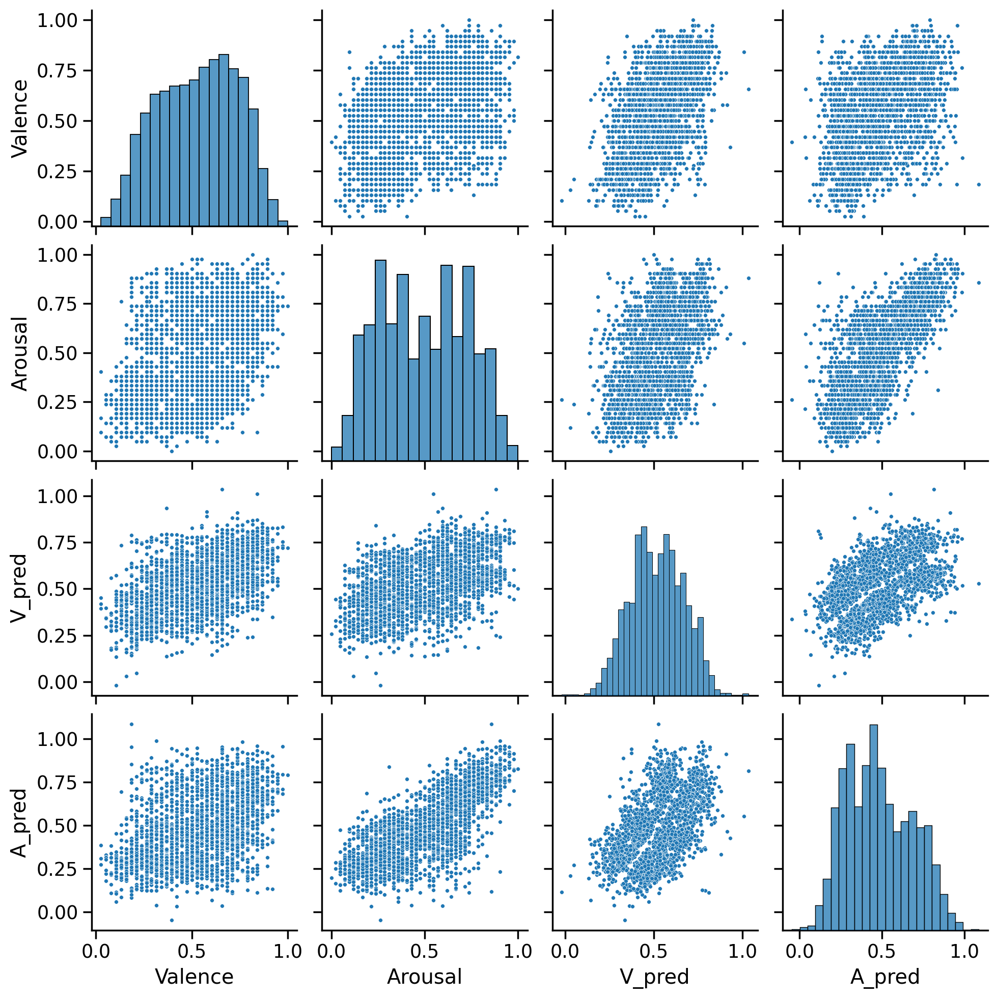

In [ ]:
latent_df = pd.concat([y_train[music_emotion_vae.va_cols], y_train_pred_df[music_emotion_vae.va_cols].rename(columns={'Valence': 'V_pred', 'Arousal': 'A_pred'})], axis=1)
sns.pairplot(latent_df, diag_kind='hist', plot_kws={'s': 8})

<Axes: >

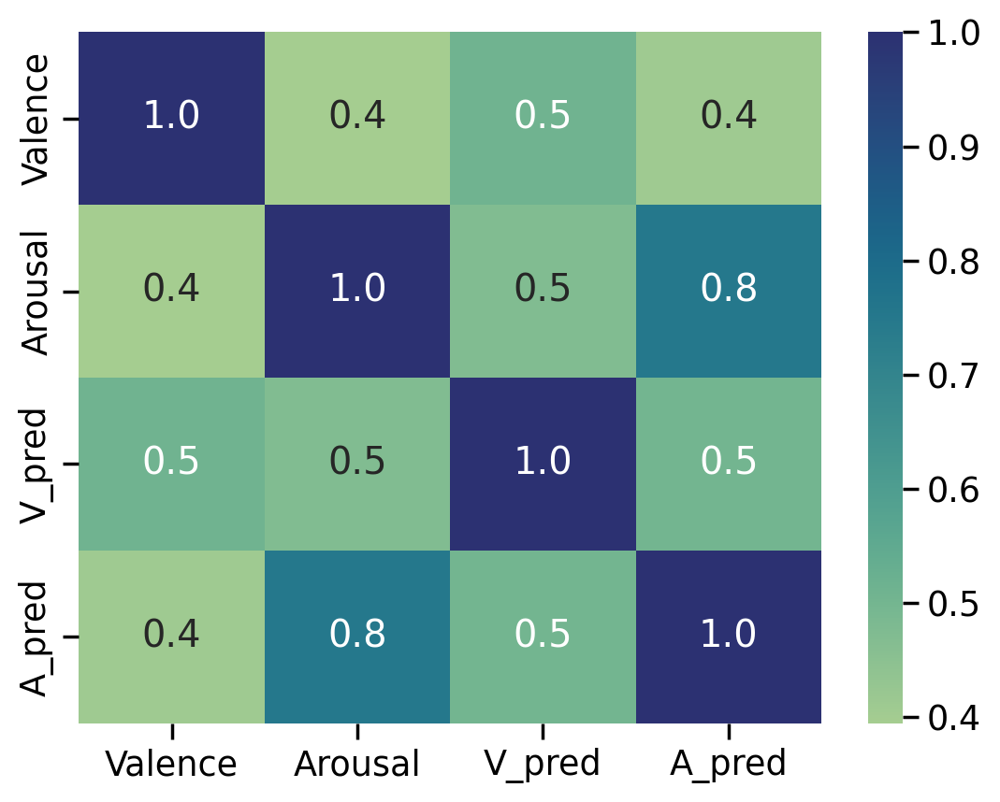

In [ ]:
sns.heatmap(latent_df.corr(), annot=True, cmap="crest", fmt=".1f")

In [ ]:
x_train.describe()

,mean_note_duration,tempo,pitch_range,mode,c5_index_0,c5_index_1,c5_index_2,c5_index_3,c5_index_4,c5_index_5,c5_index_6,c5_index_7,c5_index_8,c5_index_9,c5_index_10,c5_index_11,c5_index
count,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000
mean,-0.011549,-0.007863,0.016870,0.541312,0.032368,0.042164,0.049404,0.103066,0.071976,0.130750,0.198893,0.126917,0.075383,0.063032,0.068143,0.037905,5.742334
std,0.964757,0.993641,1.006427,0.498397,0.177013,0.201005,0.216756,0.304110,0.258503,0.337198,0.399252,0.332950,0.264065,0.243073,0.252045,0.191006,2.706736
min,-1.761400,-2.580199,-2.855414,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-0.657023,-0.795718,-0.550671,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
50%,-0.204662,0.072408,0.118448,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
75%,0.420660,0.554701,0.713220,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000
max,8.623507,5.124421,3.166656,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,11.000000


## Calculate the R2 score

In [ ]:
x_train_pred_df

,mean_note_duration,tempo,pitch_range,mode,c5_index
1513,-0.165458,-0.496529,1.527361,1.270363e-04,11
1292,0.871176,1.210430,-0.121970,1.000000e+00,2
994,-0.953152,-0.062461,0.894967,3.923027e-05,11
1392,0.599166,1.072137,0.360169,1.000000e+00,2
367,-0.250547,-0.324307,-0.041256,1.352487e-07,3
...,...,...,...,...,...
1173,0.094136,2.756177,1.492426,1.000000e+00,2
2203,0.629889,-0.200389,-1.402879,1.000000e+00,8
1804,0.357524,-0.820597,0.021999,9.999995e-01,8
1148,-0.802854,0.428607,1.498089,9.353867e-04,11


In [ ]:
x_train.head()

,mean_note_duration,tempo,pitch_range,mode,c5_index_0,c5_index_1,c5_index_2,c5_index_3,c5_index_4,c5_index_5,c5_index_6,c5_index_7,c5_index_8,c5_index_9,c5_index_10,c5_index_11,c5_index
1513,-0.558356,-0.096394,1.531032,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1292,0.729240,0.795847,-0.178938,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,10
994,-1.420764,-0.048165,0.490181,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1392,0.664883,1.133451,0.267141,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,6
367,-0.958217,-0.651030,-0.104592,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [ ]:
x_train_pred_df.head()

,mean_note_duration,tempo,pitch_range,mode,c5_index
1513,-0.165458,-0.496529,1.527361,1.270363e-04,11
1292,0.871176,1.210430,-0.121970,1.000000e+00,2
994,-0.953152,-0.062461,0.894967,3.923027e-05,11
1392,0.599166,1.072137,0.360169,1.000000e+00,2
367,-0.250547,-0.324307,-0.041256,1.352487e-07,3


In [ ]:
# Calculate R2 score on the training data.
r2_score(x_train_df, x_train_pred_df)

0.4823037145928982

In [ ]:
# Calculate R2 score on the test data.
r2_score(x_test_df, x_test_pred_df)

0.4918773296967597

In [ ]:
# Calculate R2 score on the training data.
# x_train.to_numpy() is the numpy array of the training data which was input to the Music VAE.
# x_train_pred[:,:num_music_features] is the numpy array of the training data predicted by the Music VAE.
# [:num_music_features] excludes the Valence Arousal values.
r2_score(y_train, y_train_pred_df)

0.3845884716475744

In [ ]:
# Calculate R2 score on the test data.
r2_score(y_test, y_test_pred_df)

0.28674722898029603

## Visualise the predicted training data

In [ ]:
unscaled_train_pred_df = music_emotion_vae.unscale_music_features(x_train_pred_df)
# unscaled_train_pred_df['key_index'] = round(x_train_pred_df['key_index'] * 12) % 12
unscaled_train_pred_df.describe()

,mean_note_duration,tempo,pitch_range,mode,c5_index
count,2348.000000,2348.000000,2348.000000,2.348000e+03,2348.000000
mean,0.692772,114.650391,43.230217,5.406434e-01,6.658433
std,0.302715,37.795887,11.961175,4.972362e-01,2.866736
min,0.342118,49.158497,9.564121,1.602536e-16,2.000000
25%,0.472740,84.653374,36.396406,4.336556e-07,3.000000
50%,0.624647,111.016342,44.822195,9.996272e-01,8.000000
75%,0.812985,136.706318,50.636499,1.000000e+00,8.000000
max,3.424855,295.024902,72.062035,1.000000e+00,11.000000


In [ ]:
unscaled_test_pred_df = music_emotion_vae.unscale_music_features(x_test_pred_df)
# unscaled_test_pred_df['key_index'] = round(x_test_pred_df['key_index'] * 12) % 12
unscaled_test_pred_df.describe()

,mean_note_duration,tempo,pitch_range,mode,c5_index
count,587.000000,587.000000,587.000000,5.870000e+02,587.000000
mean,0.697330,114.097633,41.930717,5.462604e-01,6.632027
std,0.334129,38.304203,11.791821,4.970681e-01,2.786032
min,0.343177,48.473789,11.027210,2.138778e-15,2.000000
25%,0.465021,84.305103,34.959822,4.032119e-07,3.000000
50%,0.613165,109.607521,43.167336,9.999226e-01,8.000000
75%,0.813470,135.811020,49.472290,1.000000e+00,8.000000
max,3.205220,287.055511,69.623245,1.000000e+00,11.000000


['Valence', 'Arousal', 'mean_note_duration', 'tempo', 'pitch_range', 'mode']


Text(0.5, 34.999999999999986, 'scale')

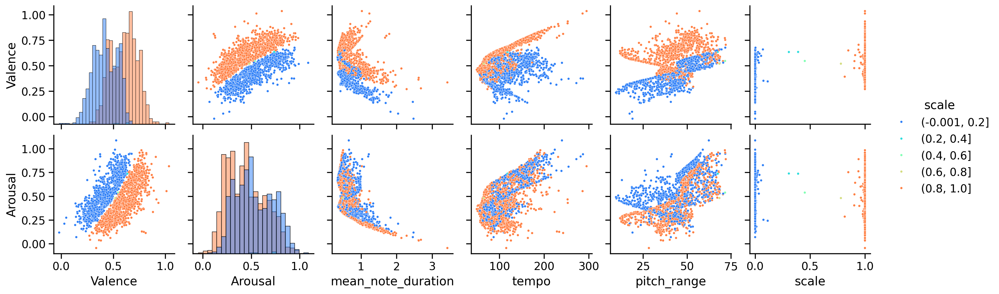

In [ ]:
# Valence: Pleasant - Unpleasant
# Arousal: Activated - Deactivated

vis_df = unscaled_train_pred_df.copy()
vis_df['Valence'] = y_train_pred_df['Valence']
vis_df['Arousal'] = y_train_pred_df['Arousal']
vis_df = vis_df[music_emotion_vae.va_cols + unscaled_train_pred_df.columns.to_list()]

vis_df['mode_cat'] = pd.cut(vis_df['mode'], bins=5)

vis_df['mode_str'] = ['major' if m > 0.5 else 'minor' for m in vis_df['mode']]
# vis_df['key'] = [circle5th_key(round(k) % 12, m) for k, m in zip(vis_df['key_index'], vis_df['mode_str'])]
x_vars = [c for c in vis_df.columns if c not in ['c5_index', 'mode_str', 'mode_cat']]
print(x_vars)

# sns.pairplot(vis_df, x_vars=x_vars, y_vars=music_emotion_vae.va_cols, diag_kind='hist', plot_kws={'s': 8}, hue='mode_cat', palette=sns.color_palette("jet_r", 5))
ax = sns.pairplot(vis_df, x_vars=x_vars, y_vars=music_emotion_vae.va_cols, diag_kind='hist', plot_kws={'s': 8}, hue='mode_cat', palette=my_5_palette)
ax._legend.set_title("scale")
ax.axes[1, 5].set_xlabel("scale")
# sns.pairplot(vis_df, vars=vars, diag_kind='hist', plot_kws={'s': 8}, hue='mode_cat', palette=sns.color_palette("jet_r", 5))


In [ ]:
[sns.color_palette("rainbow", 5)[0], sns.color_palette("rainbow", 5)[4]]

[(0.17058823529411765, 0.4946558433997788, 0.9667184042691874),
 (1.0, 0.4946558433997788, 0.2558427775944356)]

In [ ]:
vis_df.describe()

,Valence,Arousal,mean_note_duration,tempo,pitch_range,mode,c5_index
count,2348.000000,2348.000000,2348.000000,2348.000000,2348.000000,2.348000e+03,2348.000000
mean,0.519833,0.483302,0.692772,114.650391,43.230217,5.406434e-01,6.658433
std,0.150677,0.198591,0.302715,37.795887,11.961175,4.972362e-01,2.866736
min,-0.019014,-0.046443,0.342118,49.158497,9.564121,1.602536e-16,2.000000
25%,0.412562,0.316099,0.472740,84.653374,36.396406,4.336556e-07,3.000000
50%,0.520877,0.459663,0.624647,111.016342,44.822195,9.996272e-01,8.000000
75%,0.630508,0.642831,0.812985,136.706318,50.636499,1.000000e+00,8.000000
max,1.034566,1.087537,3.424855,295.024902,72.062035,1.000000e+00,11.000000


Text(0.5, 0, 'Keys in minor scale')

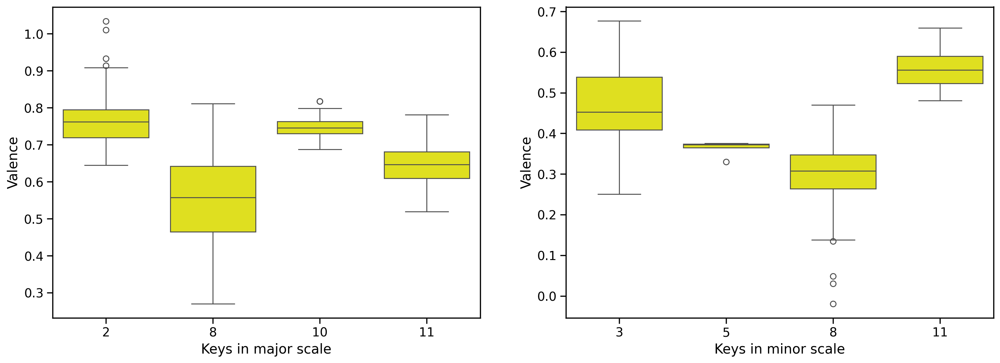

In [ ]:
vis_df_major = vis_df[vis_df['mode_str'] == 'major']
vis_df_minor = vis_df[vis_df['mode_str'] == 'minor']

x_key = 'num_accidentals' if key_encoding == 'accidentals' else 'c5_index'

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sns.boxplot(x=x_key, y='Valence', data=vis_df_major, ax=axes[0], color="yellow")
axes[0].set_xlabel('Keys in major scale')
sns.boxplot(x=x_key, y='Valence', data=vis_df_minor, ax=axes[1], color="yellow")
axes[1].set_xlabel('Keys in minor scale')

Text(0.5, 0, 'Keys in minor scale')

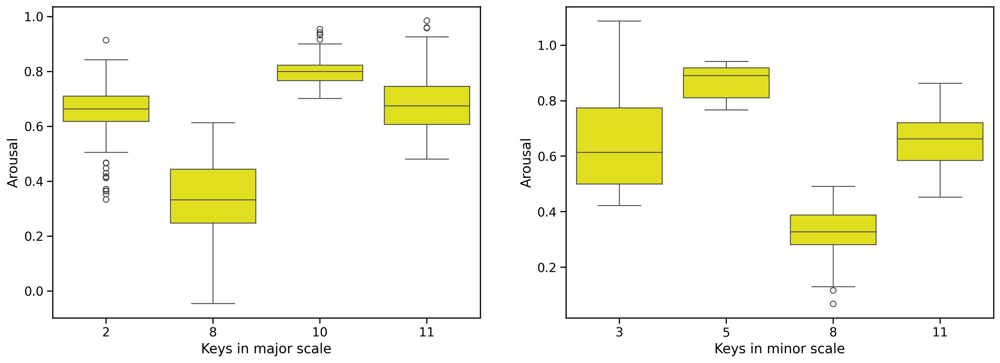

In [ ]:
x_key = 'num_accidentals' if key_encoding == 'accidentals' else 'c5_index'

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.boxplot(x=x_key, y='Arousal', data=vis_df_major, ax=axes[0], color="yellow")
axes[0].set_xlabel('Keys in major scale')
sns.boxplot(x=x_key, y='Arousal', data=vis_df_minor, ax=axes[1], color="yellow")
axes[1].set_xlabel('Keys in minor scale')

Text(0.5, 0, 'Keys in minor scale')

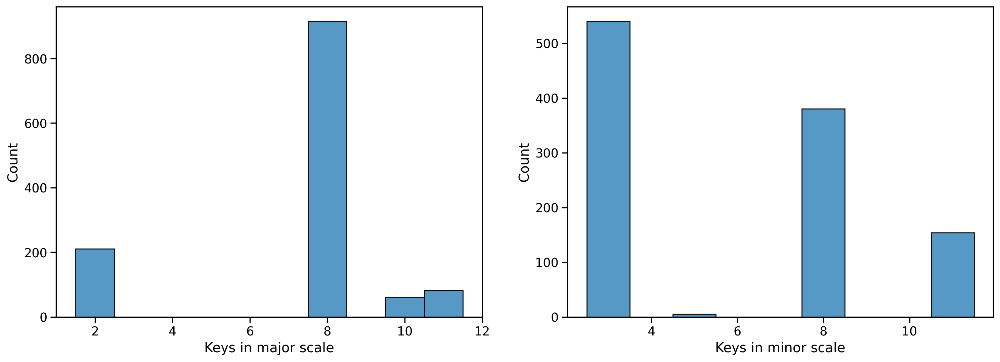

In [ ]:
# Check the number of samples in each key
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sns.histplot(vis_df_major, x=x_key, ax=axes[0], discrete=True)
# axes[0].set_xticklabels(pc_names)
axes[0].set_xlabel('Keys in major scale')
sns.histplot(vis_df_minor, x=x_key, ax=axes[1], discrete=True)
# axes[1].set_xticklabels(pc_names)
axes[1].set_xlabel('Keys in minor scale')


## Visualise the predicted test data

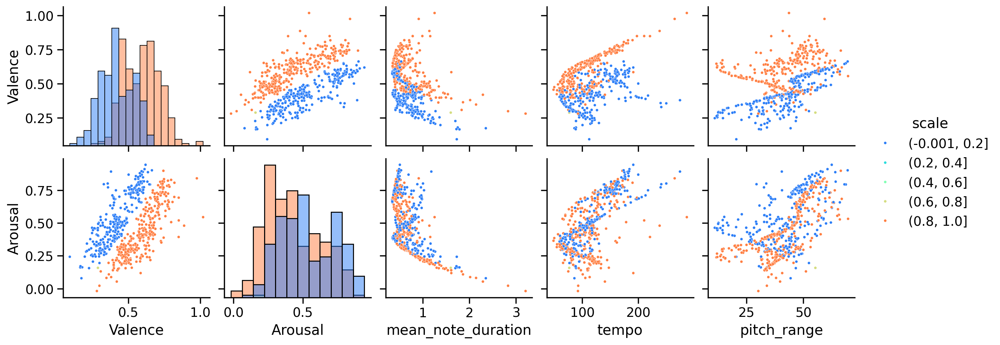

In [ ]:
# Valence: Pleasant - Unpleasant
# Arousal: Activated - Deactivated

vis_test_df = unscaled_test_pred_df.copy()
vis_test_df['Valence'] = y_test_pred_df['Valence']
vis_test_df['Arousal'] = y_test_pred_df['Arousal']
vis_test_df = vis_test_df[music_emotion_vae.va_cols + unscaled_test_pred_df.columns.to_list()]

vis_test_df['mode_cat'] = pd.cut(vis_test_df['mode'], bins=5)

vis_test_df['mode_str'] = ['major' if m > 0.5 else 'minor' for m in vis_test_df['mode']]
# vis_df['key'] = [circle5th_key(round(k) % 12, m) for k, m in zip(vis_df['key_index'], vis_df['mode_str'])]

x_vars = [v for v in x_vars if v != 'mode']
ax = sns.pairplot(vis_test_df, x_vars=x_vars, y_vars=music_emotion_vae.va_cols, diag_kind='hist', plot_kws={'s': 8}, hue='mode_cat', palette=my_5_palette)
# sns.pairplot(vis_df, vars=vars, diag_kind='hist', plot_kws={'s': 8}, hue='mode_cat', palette=sns.color_palette("jet_r", 5))
ax._legend.set_title("scale")


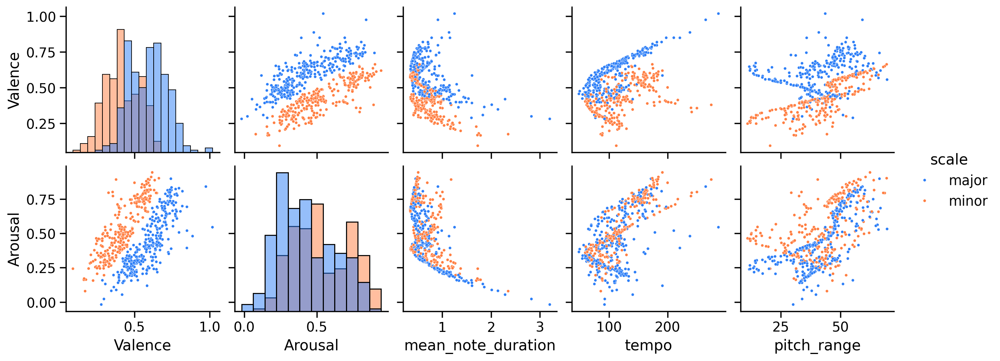

In [ ]:
ax = sns.pairplot(vis_test_df, x_vars=x_vars, y_vars=music_emotion_vae.va_cols, diag_kind='hist', plot_kws={'s': 8}, hue='mode_str', hue_order=['major', 'minor'], palette=my_2_palette)
ax._legend.set_title("scale")


Text(0.5, 0, 'Keys in minor scale')

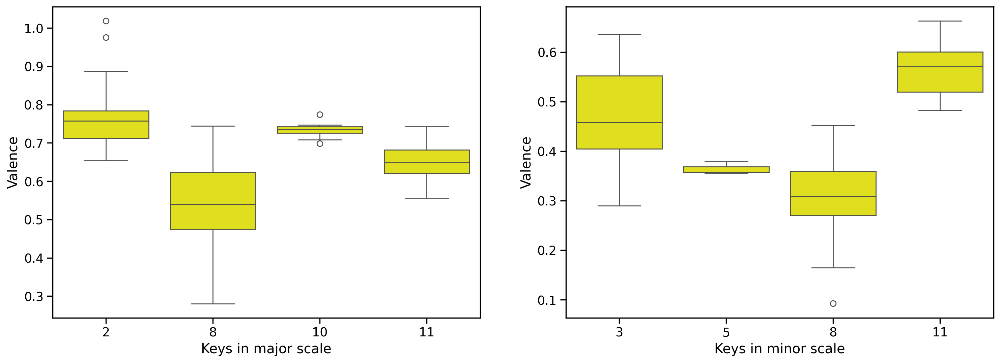

In [ ]:
vis_test_df_major = vis_test_df[vis_test_df['mode_str'] == 'major']
vis_test_df_minor = vis_test_df[vis_test_df['mode_str'] == 'minor']
x_key = 'num_accidentals' if key_encoding == 'accidentals' else 'c5_index'

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.boxplot(x=x_key, y='Valence', data=vis_test_df_major, ax=axes[0], color="yellow")
axes[0].set_xlabel('Keys in major scale')
sns.boxplot(x=x_key, y='Valence', data=vis_test_df_minor, ax=axes[1], color="yellow")
axes[1].set_xlabel('Keys in minor scale')

Text(0.5, 0, 'Keys in minor scale')

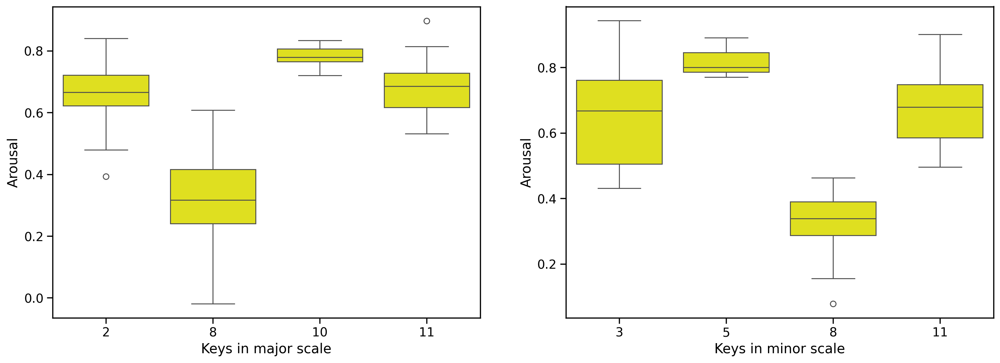

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.boxplot(x=x_key, y='Arousal', data=vis_test_df_major, ax=axes[0], color="yellow")
axes[0].set_xlabel('Keys in major scale')
sns.boxplot(x=x_key, y='Arousal', data=vis_test_df_minor, ax=axes[1], color="yellow")
axes[1].set_xlabel('Keys in minor scale')

Text(0.5, 0, 'Keys in minor scale')

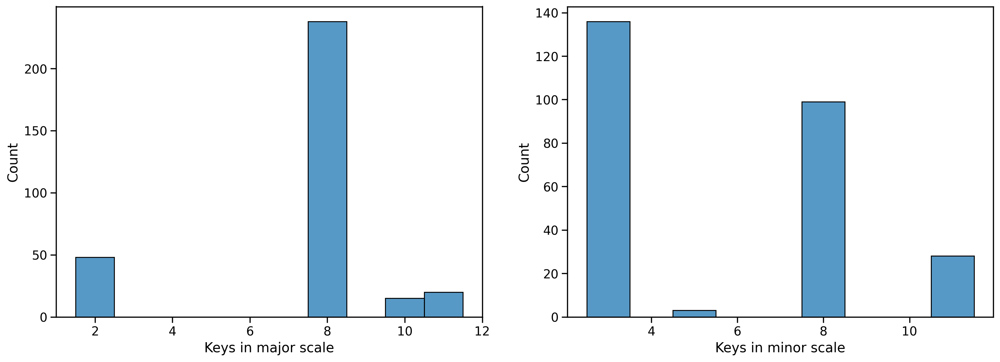

In [ ]:
# Check the number of samples in each key
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sns.histplot(vis_test_df_major, x=x_key, ax=axes[0], discrete=True)
# axes[0].set_xticklabels(pc_names)
axes[0].set_xlabel('Keys in major scale')
sns.histplot(vis_test_df_minor, x=x_key, ax=axes[1], discrete=True)
# axes[1].set_xticklabels(pc_names)
axes[1].set_xlabel('Keys in minor scale')


In [ ]:
# Count the number of major and minor mode samples
major_mode_samples = vis_test_df[vis_test_df['mode'] > 0.5].shape[0]
minor_mode_samples = vis_test_df[vis_test_df['mode'] <= 0.5].shape[0]
total_samples = vis_test_df.shape[0]
print("Major scale samples = %d (%.2f%%)" % (major_mode_samples, major_mode_samples / total_samples))
print("Minor scale samples = %d (%.2f%%)" % (minor_mode_samples, minor_mode_samples / total_samples))

# The ratio between the major and minor mode samples are almost equal to the prior distribution. 

Major scale samples = 321 (0.55%)
Minor scale samples = 266 (0.45%)


In [ ]:
# Count minor mode samples.

vis_test_df[vis_test_df['mode'] <= 0.5].shape

(266, 9)

## Generate some music features from the latent emotional space

In [ ]:
# Generate music features for some valance, arousal pairs.
result = music_emotion_vae.model.decoder.predict([
  (0.0, 0.0),
  (0.2, 0.2),
  (0.4, 0.4),
  (0.6, 0.6),
  (0.8, 0.8),
  (1.0, 1.0),
])

x_pred_df = pd.DataFrame(result, columns=df_std.columns.to_list())
unscaled_df = music_emotion_vae.unscale_music_features(x_pred_df)
# unscaled_df['key_index'] = (unscaled_df['key_index'] * 12) % 12
result_df = music_key_decoding(unscaled_df, key_encoding)
# result_df = unscaled_df
# Convert mode and key_index into string.
result_df['mode_str'] = ['major' if m > 0.5 else 'minor' for m in result_df['mode']]
# result_df['key'] = [circle5th_key(round(k) % 12, m) for k, m in zip(result_df['key_index'], result_df['mode_str'])]

result_df

1/1 [==============================] - 0s 42ms/step


,mean_note_duration,tempo,pitch_range,mode,c5_index,mode_str
0,3.051139,92.223175,31.781727,1.845544e-07,8,minor
1,1.500062,91.197563,33.965950,1.355459e-07,8,minor
2,0.399628,73.337151,40.224094,3.727073e-06,8,minor
3,0.388170,74.286301,66.253357,9.970541e-01,11,major
4,0.556946,181.112961,54.629738,1.000000e+00,2,major
5,0.800016,267.062195,65.755280,1.000000e+00,2,major


## Save the trained model

In [ ]:
music_emotion_vae.save_model()

INFO:tensorflow:Assets written to: /Users/nrjmata/Documents/UOE/EvoMusart 2026/weather_sonification/src/common/../../data/saved_models/MusicEmotionVAE.tf/assets


INFO:tensorflow:Assets written to: /Users/nrjmata/Documents/UOE/EvoMusart 2026/weather_sonification/src/common/../../data/saved_models/MusicEmotionVAE.tf/assets
